__Title:__ Case Study 1: Linear Regression  
__Authors:__ Will Butler, Robert (Reuven) Derner 
__Date:__ 8/24/23 

## Business Understanding

We have a problem that has been brought to us from a group of scientists that are looking at superconductors. Superconductors are materials that give little or no resistance to electrical current. 

The Scientists are looking at us to use the data provided to produce a model to predict new superconductors based on the properties and the data that they have found so far. Some of the data points include material composition, temperature at which they superconduct. We're going to examine the data set through exploratory data analysis. 

The model desired is going to predict new superconductors and the temperature at which they operate based on the experimental inputs from the data that they have provided to us. The model needs to be interpretable so that the scientists' can figure out at what temperature new superconductors would become superconductors, not only if they would be superconductors. We will conduct a regression type of model to give the scientists ease of interpretability based on the relative importance of each feature in the model. 
 

Data Source:

Provided by client with metadata dictionary regarding terms 

In [2]:
# Import libraries
import pandas as pd
import seaborn as sns
import numpy as np
from numpy import mean
import matplotlib.pyplot as plt
import random
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio 
from tabulate import tabulate
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix

# Workbook settings
pd.set_option('display.max_columns', None)
random.seed(110)
pio.renderers.default='notebook'

In [5]:
# Import data from github (next phase)
url = 'https://raw.githubusercontent.com/ReuvenDerner/MSDS_QuantifyingTheWorld/main/train.csv'
data = pd.read_csv(url, encoding = "utf-8")

In [3]:
# Import data from github (next phase)
url2 = 'https://raw.githubusercontent.com/ReuvenDerner/MSDS_QuantifyingTheWorld/main/unique_m.csv'
unique_m = pd.read_csv(url2, encoding = "utf-8")


In [2]:
# loacal Import (To be removed later)
# data = pd.read_csv("C:/Users/robert.derner/OneDrive - Flagship Credit Acceptance/Documents/School/Quantifying The World/Case Study One/train.csv")

## Data Meaning Type

Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file.

| Response Features | Definition                                                                                                 |
| ----------------- | ---------------------------------------------------------------------------------------------------------- |
| Critical Temp         | When a superconductor reaches critical temperature and becomes a superconductor                                                                         |

| Categorical Features | Definition                                                                                                 |
| ----------------- | ---------------------------------------------------------------------------------------------------------- |
| Number_of_elements         | The number of periodic elements contained in the superconductor                                                                         |

| Continuous Features | Definition                                                                                                 |
| ------------------- | ---------------------------------------------------------------------------------------------------------- |
| mean_atomic_mass   | The average atomic mass                                                                          |
wtd_mean_atomic_mass             | The weighted average atomic mass                                                                                    |
gmean_atomic_mass             | g-average given the atomic mass                                                                                    |
wtd_gmean_atomic_mass             | Weighted g-average given the atomic mass                                                                                   |
entropy_atomic_mass             | The degree of disorder or uncertainy given the atomic mass                                                                                    |
wtd_entropy_atomic_mass             | Weighted average degree of disorder or uncertainty given the atomic mass                                                                                    |
range_atomic_mass             | Range of atomic mass                                                                                   |
wtd_range_atomic_mass             | Weight Range of atomic mass                                                                                    |
std_atomic_mass             | Standard Deviation of atomic mass                                                                                    |
wtd_std_atomic_mass             | Weighted standard deviation of atomic mass                                                                                    |
mean_fie             | Average of Fie                                                                                    |
wtd_mean_fie             | Weighted average of fie                                                                                    |
gmean_fie             | G-Average of Fie                                                                                    |
wtd_gmean_fie             | Weighted g-average of fie                                                                                    |
entropy_fie             | The degree of disorder or uncertainty  of Fie                                                                                    |
wtd_entropy_fie             | Weighted degree of disorder or uncertainty of Fie                                                                                    |
range_fie             | Range of FIE                                                                                    |
wtd_range_fie             | Weighted Range of FIE                                                                                    |
std_fie             | Standard deviation of FIE                                                                                    |
wtd_std_fie             | Weighted Standard Deviation of FIE                                                                                    |
mean_atomic_radius             | The Average of atomic radius                                                                                    |
wtd_mean_atomic_radius             | The weighted average of atomic radius                                                                                    |
gmean_atomic_radius             | The g-average of atomic radius                                                                                    |
wtd_gmean_atomic_radius             | The weighted g-average of atomic radius                                                                                    |
entropy_atomic_radius             | The degree of disorder or uncertainty of atomic radius                                                                                    |
wtd_entropy_atomic_radius             | The weighted degree of disorder or uncertainty of atomic radius                                                                                    |
range_atomic_radius             | The range of atomic radius                                                                                    |
wtd_range_atomic_radius             | The weighted range of atomic radius                                                                                    |
std_atomic_radius             | The standard deviation of atomic radius                                                                                    |
wtd_std_atomic_radius             | The weighted standard deviation of atomic radius                                                                                   |
mean_Density             | The average Density                                                                                    |
wtd_mean_Density             | The weighted average Density                                                                                    |
gmean_Density             | The g-average Density                                                                                    |
wtd_gmean_Density             | The weghted g-average Density                                                                                    |
entropy_Density             | The degree of disorder or uncersity in Density                                                                                    |
wtd_entropy_Density             | The weighted degree of disorder or uncertainty in Density                                                                                    |
range_Density             | The range of Density                                                                                   |
wtd_range_Density             | The weighted range of Density                                                                                    |
std_Density             | The standard deviation of Density                                                                                    |
wtd_std_Density             | The weighted standard deviation of Density                                                                                    |
mean_ElectronAffinity             | The average of Electron Affinity                                                                                    |
wtd_mean_ElectronAffinity             | The weighted average of Electron Affinity                                                                                   |
entropy_ElectronAffinity             | The degree of disorder or uncersity in Electron Affinity                                                                                    |
wtd_entropy_ElectronAffinity             | The weighted degree of disorder or uncertainty in Electron Affinity                                                                                    |
range_ElectronAffinity             | The range of Electron Affinity                                                                                    |
wtd_range_ElectronAffinity             | The weighted range of Electron Affinity                                                                                    |
std_ElectronAffinity             | The standard deviation of Electron Affinity                                                                                    |
wtd_std_ElectronAffinity             | The wegithed standard deviation of Electron Affinity                                                                                    |
mean_FusionHeat             | The average of Fusion Heat                                                                                    |
wtd_mean_FusionHeat             | The weighted average of Fusion Heat                                                                                    |
gmean_FusionHeat             | The g-average of of Fusion Heat                                                                                    |
wtd_gmean_FusionHeat             | The weighted g-average of Fusion Heat                                                                                    |
entropy_FusionHeat             | The degree o fdisorder or uncertainty of Fusion Heat                                                                                    |
wtd_entropy_FusionHeat             | The weighted degree of disorder or uncertainity of Fusion Heat                                                                                    |
range_FusionHeat             | The range of Fusion Heat                                                                                    |
wtd_range_FusionHeat             | The weighted range of Fusion Heat                                                                                    |
std_FusionHeat             | The standard deviation of Fusion Heat                                                                                    |
wtd_std_FusionHeat             | The wegihted standard deviation of Fusion Heat                                                                                    |
mean_ThermalConductivity             | The average of Thermal Conductivity                                                                                    |
wtd_mean_ThermalConductivity             | The weighted average of Thermal Conductivity                                                                                    |
gmean_ThermalConductivity             | The g-average of Thermal Conductivity                                                                                    |
wtd_gmean_ThermalConductivity             | The wegihted g-mean of Thermal Conductivity                                                                                    |
entropy_ThermalConductivity             | The degree of disorder or uncertainty of Thermal Conductivity                                                                                    |
wtd_entropy_ThermalConductivity             | The weighted degree of disorder or uncertainty of Thermal Conductivity                                                                                    |
range_ThermalConductivity             | The range of Thermal Conductivity                                                                                    |
wtd_range_ThermalConductivity             | The weighted range of Thermal Conductivity                                                                                   |
std_ThermalConductivity             | The standard deviation of Thermal Conductivity                                                                                     |
wtd_std_ThermalConductivity             | The weighted standard Thermal Conductivity                                                                                    |
mean_Valence             | The average of Valence                                                                                    |
wtd_mean_Valence             | The weighted average of Valence                                                                                   |
gmean_Valence             | The g-average of Valence                                                                                    |
wtd_gmean_Valence             | The weighted g-average of Valence                                                                                    |
entropy_Valence             | The degree of disorder or uncertainty of Valence                                                                                    |
wtd_entropy_Valence             | The weighted degree of disorder or uncertainty of Valence                                                                                    |
range_Valence             | The range of Valence                                                                                    |
wtd_range_Valence             | The weghted range of Valence                                                                                    |
std_Valence             | The standard deviation of Valence                                                                                    |
wtd_std_Valence             | The standard deviation of Valence                                                                                    |
   |

## Data Quality

In [17]:
data.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,mean_fie,wtd_mean_fie,gmean_fie,wtd_gmean_fie,entropy_fie,wtd_entropy_fie,range_fie,wtd_range_fie,std_fie,wtd_std_fie,mean_atomic_radius,wtd_mean_atomic_radius,gmean_atomic_radius,wtd_gmean_atomic_radius,entropy_atomic_radius,wtd_entropy_atomic_radius,range_atomic_radius,wtd_range_atomic_radius,std_atomic_radius,wtd_std_atomic_radius,mean_Density,wtd_mean_Density,gmean_Density,wtd_gmean_Density,entropy_Density,wtd_entropy_Density,range_Density,wtd_range_Density,std_Density,wtd_std_Density,mean_ElectronAffinity,wtd_mean_ElectronAffinity,gmean_ElectronAffinity,wtd_gmean_ElectronAffinity,entropy_ElectronAffinity,wtd_entropy_ElectronAffinity,range_ElectronAffinity,wtd_range_ElectronAffinity,std_ElectronAffinity,wtd_std_ElectronAffinity,mean_FusionHeat,wtd_mean_FusionHeat,gmean_FusionHeat,wtd_gmean_FusionHeat,entropy_FusionHeat,wtd_entropy_FusionHeat,range_FusionHeat,wtd_range_FusionHeat,std_FusionHeat,wtd_std_FusionHeat,mean_ThermalConductivity,wtd_mean_ThermalConductivity,gmean_ThermalConductivity,wtd_gmean_ThermalConductivity,entropy_ThermalConductivity,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,std_ThermalConductivity,wtd_std_ThermalConductivity,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.906070,31.794921,51.968828,53.622535,775.425000,1010.268571,718.152900,938.016780,1.305967,0.791488,810.600000,735.985714,323.811808,355.562967,160.250000,105.514286,136.126003,84.528423,1.259244,1.207040,205,42.914286,75.237540,69.235569,4654.357250,2961.502286,724.953211,53.543811,1.033129,0.814598,8958.571000,1579.583429,3306.162897,3572.596624,81.837500,111.727143,60.123179,99.414682,1.159687,0.787382,127.050000,80.987143,51.433712,42.558396,6.905500,3.846857,3.479475,1.040986,1.088575,0.994998,12.878000,1.744571,4.599064,4.666920,107.756645,61.015189,7.062488,0.621979,0.308148,0.262848,399.973420,57.127669,168.854244,138.517163,2.250000,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.000000
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.906070,36.161939,47.094633,53.979870,766.440000,1010.612857,720.605511,938.745413,1.544145,0.807078,810.600000,743.164286,290.183029,354.963511,161.200000,104.971429,141.465215,84.370167,1.508328,1.204115,205,50.571429,67.321319,68.008817,5821.485800,3021.016571,1237.095080,54.095718,1.314442,0.914802,10488.571000,1667.383429,3767.403176,3632.649185,90.890000,112.316429,69.833315,101.166398,1.427997,0.838666,127.050000,81.207857,49.438167,41.667621,7.784400,3.796857,4.403790,1.035251,1.374977,1.073094,12.878000,1.595714,4.473363,4.603000,172.205316,61.372331,16.064228,0.619735,0.847404,0.567706,429.973420,51.413383,198.554600,139.630922,2.000000,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.000000
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.906070,35.741099,51.968828,53.656268,775.425000,1010.820000,718.152900,939.009036,1.305967,0.773620,810.600000,743.164286,323.811808,354.804183,160.250000,104.685714,136.126003,84.214573,1.259244,1.132547,205,49.314286,75.237540,67.797712,4654.357250,2999.159429,724.953211,53.974022,1.033129,0.760305,8958.571000,1667.383429,3306.162897,3592.019281,81.837500,112.213571,60.123179,101.082152,1.159687,0.786007,127.050000,81.207857,51.433712,41.639878,6.905500,3.822571,3.479475,1.037439,1.088575,0.927479,12.878000,1.757143,4.599064,4.649635,107.756645,60.943760,7.062488,0.619095,0.308148,0.250477,399.973420,57.127669,168.854244,138.540613,2.250000,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.0000

In [18]:
unique_m.head()

,H,He,Li,Be,B,C,N,O,F,Ne,Na,Mg,Al,Si,P,S,Cl,Ar,K,Ca,Sc,Ti,V,Cr,Mn,Fe,Co,Ni,Cu,Zn,Ga,Ge,As,Se,Br,Kr,Rb,Sr,Y,Zr,Nb,Mo,Tc,Ru,Rh,Pd,Ag,Cd,In,Sn,Sb,Te,I,Xe,Cs,Ba,La,Ce,Pr,Nd,Pm,Sm,Eu,Gd,Tb,Dy,Ho,Er,Tm,Yb,Lu,Hf,Ta,W,Re,Os,Ir,Pt,Au,Hg,Tl,Pb,Bi,Po,At,Rn,critical_temp,material
0,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.200000,1.800000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,29.000000,Ba0.2La1.8Cu1O4
1,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.100000,1.900000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,26.000000,Ba0.1La1.9Ag0.1Cu0.9O4
2,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.100000,1.900000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,19.000000,Ba0.1La1.9Cu1O4
3,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.150000,1.850000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,22.000000,Ba0.15La1.85Cu1O4
4,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.300000,1.700000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,23.000000,Ba0.3La1.7Cu1O4


In [4]:
unique_m.shape

(21263, 88)

In [3]:
data.shape

(21263, 82)

Both files from the study have the same number of records, one contains the number of elements utilized while the other contains the significant statistical measures of various components of the superconductors. 

__Missing Values__  
The dataset contains no missing values. There is nothing for us to imputate or reshape. 

For the purposes of regression on the Critical Temp, we may proceed with the analysis.

In [4]:
# Features with Null Values and Percent missing
null_df = pd.DataFrame(data[data.columns[data.isnull().any()]].isnull().sum()).reset_index()
null_df.columns = ['Feature', 'Value']
null_df['Percent'] = round((null_df['Value'] / data.shape[0] * 100),2)

null_df

,Feature,Value,Percent


In [6]:
# Features with Null Values and Percent missing
null_df = pd.DataFrame(unique_m[unique_m.columns[unique_m.isnull().any()]].isnull().sum()).reset_index()
null_df.columns = ['Feature', 'Value']
null_df['Percent'] = round((null_df['Value'] / unique_m.shape[0] * 100),2)

null_df

,Feature,Value,Percent


__Duplicate Values__  
There are 66 duplicate values in the data set. No action was needed.

In [5]:
# Duplicate record validation
data.duplicated().sum()

66

In [7]:
# Duplicate record validation
unique_m.duplicated().sum()

0

In [25]:
### Examine uniquenss of response variable
is_unique = data['critical_temp'].nunique() == data.shape[0]

print(is_unique)


False


### Join data files

In [71]:
merged_df = pd.merge(data, unique_m, left_index=True, right_index=True, how="left") #Thank you google

In [72]:
merged_df.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,mean_fie,wtd_mean_fie,gmean_fie,wtd_gmean_fie,entropy_fie,wtd_entropy_fie,range_fie,wtd_range_fie,std_fie,wtd_std_fie,mean_atomic_radius,wtd_mean_atomic_radius,gmean_atomic_radius,wtd_gmean_atomic_radius,entropy_atomic_radius,wtd_entropy_atomic_radius,range_atomic_radius,wtd_range_atomic_radius,std_atomic_radius,wtd_std_atomic_radius,mean_Density,wtd_mean_Density,gmean_Density,wtd_gmean_Density,entropy_Density,wtd_entropy_Density,range_Density,wtd_range_Density,std_Density,wtd_std_Density,mean_ElectronAffinity,wtd_mean_ElectronAffinity,gmean_ElectronAffinity,wtd_gmean_ElectronAffinity,entropy_ElectronAffinity,wtd_entropy_ElectronAffinity,range_ElectronAffinity,wtd_range_ElectronAffinity,std_ElectronAffinity,wtd_std_ElectronAffinity,mean_FusionHeat,wtd_mean_FusionHeat,gmean_FusionHeat,wtd_gmean_FusionHeat,entropy_FusionHeat,wtd_entropy_FusionHeat,range_FusionHeat,wtd_range_FusionHeat,std_FusionHeat,wtd_std_FusionHeat,mean_ThermalConductivity,wtd_mean_ThermalConductivity,gmean_ThermalConductivity,wtd_gmean_ThermalConductivity,entropy_ThermalConductivity,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,std_ThermalConductivity,wtd_std_ThermalConductivity,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp_x,H,He,Li,Be,B,C,N,O,F,Ne,Na,Mg,Al,Si,P,S,Cl,Ar,K,Ca,Sc,Ti,V,Cr,Mn,Fe,Co,Ni,Cu,Zn,Ga,Ge,As,Se,Br,Kr,Rb,Sr,Y,Zr,Nb,Mo,Tc,Ru,Rh,Pd,Ag,Cd,In,Sn,Sb,Te,I,Xe,Cs,Ba,La,Ce,Pr,Nd,Pm,Sm,Eu,Gd,Tb,Dy,Ho,Er,Tm,Yb,Lu,Hf,Ta,W,Re,Os,Ir,Pt,Au,Hg,Tl,Pb,Bi,Po,At,Rn,critical_temp_y,material
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.906070,31.794921,51.968828,53.622535,775.425000,1010.268571,718.152900,938.016780,1.305967,0.791488,810.600000,735.985714,323.811808,355.562967,160.250000,105.514286,136.126003,84.528423,1.259244,1.207040,205,42.914286,75.237540,69.235569,4654.357250,2961.502286,724.953211,53.543811,1.033129,0.814598,8958.571000,1579.583429,3306.162897,3572.596624,81.837500,111.727143,60.123179,99.414682,1.159687,0.787382,127.050000,80.987143,51.433712,42.558396,6.905500,3.846857,3.479475,1.040986,1.088575,0.994998,12.878000,1.744571,4.599064,4.666920,107.756645,61.015189,7.062488,0.621979,0.308148,0.262848,399.973420,57.127669,168.854244,138.517163,2.250000,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.200000,1.800000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,29.000000,Ba0.2La1.8Cu1O4
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.906070,36.161939,47.094633,53.979870,766.440000,1010.612857,720.605511,938.745413,1.544145,0.807078,810.600000,743.164286,290.183029,354.963511,161.200000,104.971429,141.465215,84.370167,1.508328,1.204115,205,50.571429,67.321319,68.008817,5821.485800,3021.016571,1237.095080,54.095718,1.314442,0.914802,10488.571000,1667.383429,3767.403176,3632.649185,90.890000,112.316429,69.833315,101.166398,1.427997,0.838666,127.050000,81.207857,49.438167,41.667621,7.784400,3.796857,4.403790,1.035251,1.374977,1.073094,12.878000,1.595714,4

In [73]:
# Check there is no cartisian
merged_df.shape

(21263, 170)

In [74]:
# Drop the secondary critical temp from unique_m dataset
merged_df_final = merged_df.drop(['critical_temp_y','material'], axis=1)

In [75]:
# Check the secondary critical temp is removed
merged_df_final.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,mean_fie,wtd_mean_fie,gmean_fie,wtd_gmean_fie,entropy_fie,wtd_entropy_fie,range_fie,wtd_range_fie,std_fie,wtd_std_fie,mean_atomic_radius,wtd_mean_atomic_radius,gmean_atomic_radius,wtd_gmean_atomic_radius,entropy_atomic_radius,wtd_entropy_atomic_radius,range_atomic_radius,wtd_range_atomic_radius,std_atomic_radius,wtd_std_atomic_radius,mean_Density,wtd_mean_Density,gmean_Density,wtd_gmean_Density,entropy_Density,wtd_entropy_Density,range_Density,wtd_range_Density,std_Density,wtd_std_Density,mean_ElectronAffinity,wtd_mean_ElectronAffinity,gmean_ElectronAffinity,wtd_gmean_ElectronAffinity,entropy_ElectronAffinity,wtd_entropy_ElectronAffinity,range_ElectronAffinity,wtd_range_ElectronAffinity,std_ElectronAffinity,wtd_std_ElectronAffinity,mean_FusionHeat,wtd_mean_FusionHeat,gmean_FusionHeat,wtd_gmean_FusionHeat,entropy_FusionHeat,wtd_entropy_FusionHeat,range_FusionHeat,wtd_range_FusionHeat,std_FusionHeat,wtd_std_FusionHeat,mean_ThermalConductivity,wtd_mean_ThermalConductivity,gmean_ThermalConductivity,wtd_gmean_ThermalConductivity,entropy_ThermalConductivity,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,std_ThermalConductivity,wtd_std_ThermalConductivity,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp_x,H,He,Li,Be,B,C,N,O,F,Ne,Na,Mg,Al,Si,P,S,Cl,Ar,K,Ca,Sc,Ti,V,Cr,Mn,Fe,Co,Ni,Cu,Zn,Ga,Ge,As,Se,Br,Kr,Rb,Sr,Y,Zr,Nb,Mo,Tc,Ru,Rh,Pd,Ag,Cd,In,Sn,Sb,Te,I,Xe,Cs,Ba,La,Ce,Pr,Nd,Pm,Sm,Eu,Gd,Tb,Dy,Ho,Er,Tm,Yb,Lu,Hf,Ta,W,Re,Os,Ir,Pt,Au,Hg,Tl,Pb,Bi,Po,At,Rn
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.906070,31.794921,51.968828,53.622535,775.425000,1010.268571,718.152900,938.016780,1.305967,0.791488,810.600000,735.985714,323.811808,355.562967,160.250000,105.514286,136.126003,84.528423,1.259244,1.207040,205,42.914286,75.237540,69.235569,4654.357250,2961.502286,724.953211,53.543811,1.033129,0.814598,8958.571000,1579.583429,3306.162897,3572.596624,81.837500,111.727143,60.123179,99.414682,1.159687,0.787382,127.050000,80.987143,51.433712,42.558396,6.905500,3.846857,3.479475,1.040986,1.088575,0.994998,12.878000,1.744571,4.599064,4.666920,107.756645,61.015189,7.062488,0.621979,0.308148,0.262848,399.973420,57.127669,168.854244,138.517163,2.250000,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.200000,1.800000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.906070,36.161939,47.094633,53.979870,766.440000,1010.612857,720.605511,938.745413,1.544145,0.807078,810.600000,743.164286,290.183029,354.963511,161.200000,104.971429,141.465215,84.370167,1.508328,1.204115,205,50.571429,67.321319,68.008817,5821.485800,3021.016571,1237.095080,54.095718,1.314442,0.914802,10488.571000,1667.383429,3767.403176,3632.649185,90.890000,112.316429,69.833315,101.166398,1.427997,0.838666,127.050000,81.207857,49.438167,41.667621,7.784400,3.796857,4.403790,1.035251,1.374977,1.073094,12.878000,1.595714,4.473363,4.603000,172.205316,61.372331,16.064228,0.6

__Data Type Conversion__  
In this section we grouped all features by their correct data type and converted each to their coresponding group. This facilitates a much easier analysis into the statistics of each feature type.

In [79]:
# Features grouped by data type
cat_features = ['number_of_elements','H','He','Li','Be','B','C','N','O','F','Ne','Na','Mg','Al','Si','P','S','Cl','Ar','K',
                'Ca','Sc','Ti','V','Cr','Mn','Fe','Co','Ni','Cu','Zn','Ga','Ge','As','Se','Br','Kr','Rb','Sr','Y','Zr','Nb',
                'Mo','Tc','Ru','Rh','Pd','Ag','Cd','In','Sn','Sb','Te','I','Xe','Cs','Ba','La','Ce','Pr','Nd','Pm','Sm','Eu',
                'Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu','Hf','Ta','W','Re','Os','Ir','Pt','Au','Hg','Tl','Pb','Bi','Po','At',
                'Rn']
cont_features = ['mean_atomic_mass','wtd_mean_atomic_mass','gmean_atomic_mass','wtd_gmean_atomic_mass',
                 'entropy_atomic_mass','wtd_entropy_atomic_mass','range_atomic_mass','wtd_range_atomic_mass','std_atomic_mass',
                 'wtd_std_atomic_mass','mean_fie', 'wtd_mean_fie','gmean_fie','wtd_gmean_fie','entropy_fie','wtd_entropy_fie',
                 'range_fie','wtd_range_fie','std_fie','wtd_std_fie','mean_atomic_radius','wtd_mean_atomic_radius',
                 'gmean_atomic_radius','wtd_gmean_atomic_radius','entropy_atomic_radius','wtd_entropy_atomic_radius',
                 'range_atomic_radius','wtd_range_atomic_radius','std_atomic_radius','wtd_std_atomic_radius','mean_Density',
                 'wtd_mean_Density','gmean_Density','wtd_gmean_Density','entropy_Density','wtd_entropy_Density','range_Density',
                 'wtd_range_Density','std_Density','wtd_std_Density','mean_ElectronAffinity','wtd_mean_ElectronAffinity',
                 'gmean_ElectronAffinity','wtd_gmean_ElectronAffinity','entropy_ElectronAffinity','wtd_entropy_ElectronAffinity',
                 'range_ElectronAffinity','wtd_range_ElectronAffinity','std_ElectronAffinity','wtd_std_ElectronAffinity',
                 'mean_FusionHeat','wtd_mean_FusionHeat','gmean_FusionHeat','wtd_gmean_FusionHeat','entropy_FusionHeat',
                 'wtd_entropy_FusionHeat','range_FusionHeat','wtd_range_FusionHeat','std_FusionHeat','wtd_std_FusionHeat',
                 'mean_ThermalConductivity','wtd_mean_ThermalConductivity','gmean_ThermalConductivity',
                 'wtd_gmean_ThermalConductivity','entropy_ThermalConductivity','wtd_entropy_ThermalConductivity',
                 'range_ThermalConductivity','wtd_range_ThermalConductivity','std_ThermalConductivity',
                 'wtd_std_ThermalConductivity','mean_Valence','wtd_mean_Valence','gmean_Valence','wtd_gmean_Valence',
                 'entropy_Valence','wtd_entropy_Valence','range_Valence','wtd_range_Valence','std_Valence','wtd_std_Valence']

__Outliers__  

In [10]:
# Histogram of Critical Temperature
fig = px.histogram(crit_temp_df, x="critical_temp", nbins = 20)
fig.show()

The most interesting detail of note from this table is the overall variation in the distribution of critical temperature. Noting that the range for when a superconductor goes critical can vary greatly between the low of 1 degree celeicus to a high of 144 degrees celicus.  In the little over 21,000 observations from the study, only 143 (0.67%) of superconductors reached critical temperatre at 80 degrees celiecus. There does appear to be some outliers in the data as the histogram reveals a right tailed distribution, we may want to logrithmically scale the data to standardize our analysis.

In [53]:
# Box Plot - Critical Temp by Number of Elements (string)
fig = px.box(merged_df_final[merged_df_final['critical_temp_x']==True], x='number_of_elements',
             width=800, height=400, title='Box Plot -Number of Elements')
fig.show()

The above box plot indicates that during critical temperature the number of elements is 3 or below with an upper bound of 4 elements contained in the superconductor. There is a degree of outliers at 6 elements contained with the data does exist but the vast majoritiy of elements is three.  

## Simple Statistics

In [47]:
summary_stats = merged_df_final.describe()

summary_stats_tb = summary_stats.transpose()

pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:2f}'.format) # Format numeric values
print(summary_stats_tb)

                             count      mean       std      min       25%  \
number_of_elements    21263.000000  4.115224  1.439295 1.000000  3.000000   
mean_atomic_mass      21263.000000 87.557631 29.676497 6.941000 72.458076   
wtd_mean_atomic_mass  21263.000000 72.988310 33.490406 6.423452 52.143839   
gmean_atomic_mass     21263.000000 71.290627 31.030272 5.320573 58.041225   
wtd_gmean_atomic_mass 21263.000000 58.539916 36.651067 1.960849 35.248990   
...                            ...       ...       ...      ...       ...   
Pb                    21263.000000  0.042461  0.274365 0.000000  0.000000   
Bi                    21263.000000  0.201009  0.655927 0.000000  0.000000   
Po                    21263.000000  0.000000  0.000000 0.000000  0.000000   
At                    21263.000000  0.000000  0.000000 0.000000  0.000000   
Rn                    21263.000000  0.000000  0.000000 0.000000  0.000000   

                            50%        75%        max  
number_of_elements 

In [13]:
summary_stats_m = unique_m.describe()

summary_stats_tb_m = summary_stats_m.transpose()

pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:2f}'.format) # Format numeric values
print(summary_stats_tb_m)

                     count      mean       std      min      25%       50%  \
H             21263.000000  0.017685  0.267220 0.000000 0.000000  0.000000   
He            21263.000000  0.000000  0.000000 0.000000 0.000000  0.000000   
Li            21263.000000  0.012125  0.129552 0.000000 0.000000  0.000000   
Be            21263.000000  0.034638  0.848541 0.000000 0.000000  0.000000   
B             21263.000000  0.142594  1.044486 0.000000 0.000000  0.000000   
...                    ...       ...       ...      ...      ...       ...   
Bi            21263.000000  0.201009  0.655927 0.000000 0.000000  0.000000   
Po            21263.000000  0.000000  0.000000 0.000000 0.000000  0.000000   
At            21263.000000  0.000000  0.000000 0.000000 0.000000  0.000000   
Rn            21263.000000  0.000000  0.000000 0.000000 0.000000  0.000000   
critical_temp 21263.000000 34.421219 34.254362 0.000210 5.365000 20.000000   

                    75%        max  
H              0.000000  1

In [51]:
# Cancellation Frequency
crit_temp_df = pd.DataFrame(merged_df_final['critical_temp_x'].value_counts()).reset_index()
crit_temp_df.columns = ['critical_temp', 'Count']
crit_temp_df['Frequency'] = round(crit_temp_df['Count'] / sum(crit_temp_df['Count']) * 100, 2)
crit_temp_df

,critical_temp,Count,Frequency
0,80.000000,143,0.670000
1,20.000000,129,0.610000
2,30.000000,125,0.590000
3,90.000000,122,0.570000
4,40.000000,111,0.520000
...,...,...,...
3002,6.170000,1,0.000000
3003,4.345000,1,0.000000
3004,20.460000,1,0.000000
3005,19.090000,1,0.000000


## Visualize Attributes

Below we see a histogram of the Average Atomic Mass between the superconductor temperatures achiecving critical mass. We see the average atomic mass rapidly rise as we hit the 72 - 78 marker then drop signficantly at around 80 only to rise again at around 88. A gradual decline with many peaks and valleys until the 144 mark where the peaks begin to become noticeably smaller in size and frequency. The bulk of the data as an average of 84.9 atomic mass with a range between 70 - 90.

In [54]:
# Histogram of Atomic mass
fig = px.histogram(merged_df_final, x='mean_atomic_mass', marginal="box",width=800, height=400, 
                   title='Distribution Plot - Average Atomic Mass')
fig.show()

Below we see a Histogram of weighted thermal conductivity. This histogram has a similar shape to that of the distrbution histogram for the average atomic mass. The histogram of thermal conductivity has more of a right tailled skewness but a simliar peaks and valleys to the atomic mass above. We can note rapid growth when thermal conductivity with the vast majority of study indicating a massive peak between a 60 - 62 thermal condicutivty for superconductors with an average of 73.3. It's good to note that the abilitiy of a material to move heat quickly and efficiently, materials with a high thermal conductivity can transfer heat rapidly from one location ot another. 

In [55]:
# Histogram by Weighted Thermal Conductivity
fig = px.histogram(merged_df_final, x='wtd_mean_ThermalConductivity', 
                   marginal="box",width=800, height=400, title='Distribution Plot - Thermal Conductivity')
fig.show()

## Explore Correlations

In [56]:
# First step to explore any relationships between data would be to do a correlation
merged_df_final.corr()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,mean_fie,wtd_mean_fie,gmean_fie,wtd_gmean_fie,entropy_fie,wtd_entropy_fie,range_fie,wtd_range_fie,std_fie,wtd_std_fie,mean_atomic_radius,wtd_mean_atomic_radius,gmean_atomic_radius,wtd_gmean_atomic_radius,entropy_atomic_radius,wtd_entropy_atomic_radius,range_atomic_radius,wtd_range_atomic_radius,std_atomic_radius,wtd_std_atomic_radius,mean_Density,wtd_mean_Density,gmean_Density,wtd_gmean_Density,entropy_Density,wtd_entropy_Density,range_Density,wtd_range_Density,std_Density,wtd_std_Density,mean_ElectronAffinity,wtd_mean_ElectronAffinity,gmean_ElectronAffinity,wtd_gmean_ElectronAffinity,entropy_ElectronAffinity,wtd_entropy_ElectronAffinity,range_ElectronAffinity,wtd_range_ElectronAffinity,std_ElectronAffinity,wtd_std_ElectronAffinity,mean_FusionHeat,wtd_mean_FusionHeat,gmean_FusionHeat,wtd_gmean_FusionHeat,entropy_FusionHeat,wtd_entropy_FusionHeat,range_FusionHeat,wtd_range_FusionHeat,std_FusionHeat,wtd_std_FusionHeat,mean_ThermalConductivity,wtd_mean_ThermalConductivity,gmean_ThermalConductivity,wtd_gmean_ThermalConductivity,entropy_ThermalConductivity,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,std_ThermalConductivity,wtd_std_ThermalConductivity,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp_x,H,He,Li,Be,B,C,N,O,F,Ne,Na,Mg,Al,Si,P,S,Cl,Ar,K,Ca,Sc,Ti,V,Cr,Mn,Fe,Co,Ni,Cu,Zn,Ga,Ge,As,Se,Br,Kr,Rb,Sr,Y,Zr,Nb,Mo,Tc,Ru,Rh,Pd,Ag,Cd,In,Sn,Sb,Te,I,Xe,Cs,Ba,La,Ce,Pr,Nd,Pm,Sm,Eu,Gd,Tb,Dy,Ho,Er,Tm,Yb,Lu,Hf,Ta,W,Re,Os,Ir,Pt,Au,Hg,Tl,Pb,Bi,Po,At,Rn
number_of_elements,1.000000,-0.141923,-0.353064,-0.292969,-0.454525,0.939304,0.881845,0.682777,-0.320293,0.513998,0.546391,0.167451,0.484445,0.024229,0.424152,0.973195,0.719209,0.781227,0.329624,0.674005,0.717831,-0.001389,-0.422144,-0.240444,-0.518256,0.972245,0.904121,0.768060,-0.371350,0.624810,0.695089,-0.418675,-0.507895,-0.630504,-0.649882,0.871832,0.767078,0.413486,-0.355389,0.210724,0.334072,-0.119303,0.195608,-0.356067,-0.052884,0.877304,0.625798,0.531540,0.241411,0.423738,0.480813,-0.437624,-0.449272,-0.514252,-0.519109,0.900759,0.860479,0.005734,-0.371788,-0.113361,-0.074796,0.227656,0.206069,-0.485324,-0.469206,0.501871,0.207065,0.696060,0.316772,0.602018,0.665580,-0.609412,-0.648551,-0.618512,-0.659268,0.967832,0.892559,0.231874,-0.447770,0.105365,0.035216,0.601069,0.000950,NaN,-0.033713,-0.039801,-0.069869,-0.076534,-0.046001,0.541654,0.083068,NaN,-0.016082,-0.062128,-0.044387,-0.069016,-0.028974,-0.058567,0.015625,NaN,-0.048214,0.260772,-0.027056,-0.042975,-0.065039,-0.016153,-0.013550,0.023825,-0.029350,-0.034140,0.416454,-0.008316,-0.062019,-0.053670,0.028742,-0.087924,-0.002040,NaN,-0.051874,0.475223,0.165323,-0.092858,-0.075090,-0.062211,-0.055049,-0.041788,-0.059083,-0.048377,-0.023183,-0.009915,-0.053554,-0.055459,-0.038986,-0.048162,0.018590,NaN,-0.030937,0.288504,-0.006440,0.057134,0.010574,0.086448,NaN,0.059387,0.092002,0.131634,-0.004529,0.033270,0.025838,0.038728,0.002195,0.013471,-0.022754,-0.040189,-0.042999,-0.053299,-0.042371,-0.056916,-0.049955,-0.036926,-0.027695,0.116987,0.113393,0.064947,0.249738,NaN,NaN,NaN
mean_atomic_mass,-0.141923,1.000000,0.815977,0.940298,0.745841,-0.104000,-0.097609,0.125659,0.446225,0.196460,0.130675,-0.285782,-0.222097,-0.240565,-0.219381,-0.166935,-0.163565,-0.255628,-0.080545,-0.276561,-0.222812,0.497664,0.376760,0.561061,0.359894,-0.140034,-0.147604,-0.270695,0.141100,-0.326403,-0.280440,0.756861,0.608935,0.596485,0.525588,-0.043416,0.026325,0.198067,0.342391,0.245042,0.180943,0.088230,0.061103,0.189282,0.134382,-0.091539,-0.107651,-0.187069,0.010235,-0.164960,-0.133101,-0.137669,-0.135429,0.014818,-0.043003,-0.008499,-0.028541,-0.347582,-0.167528,-0.33796

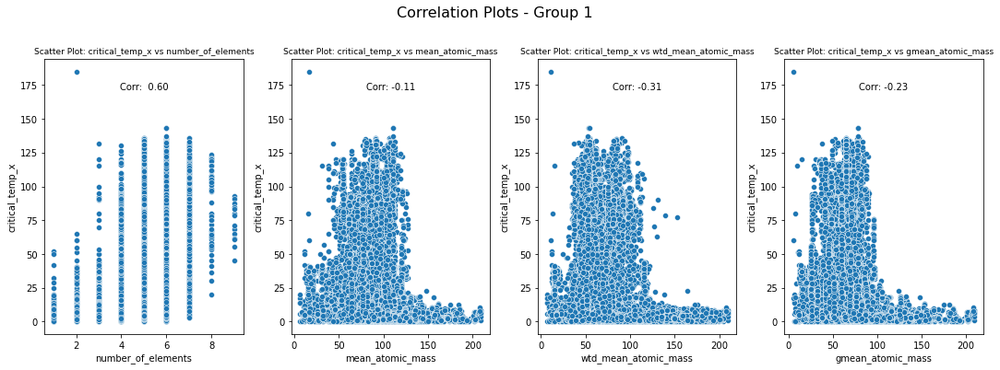

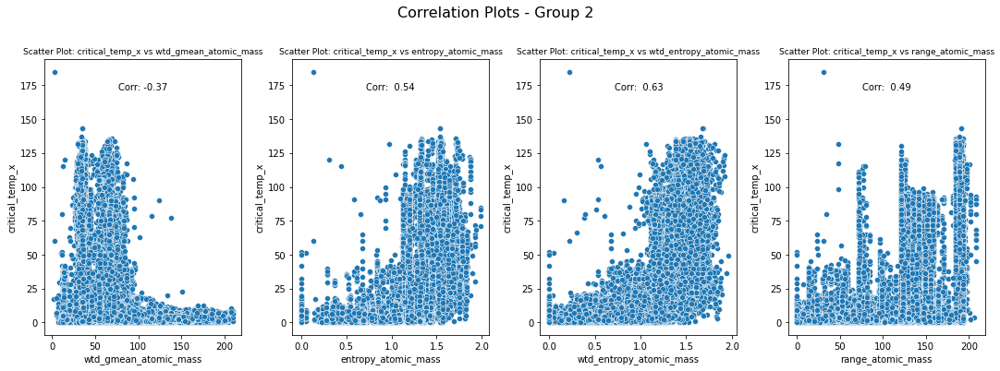

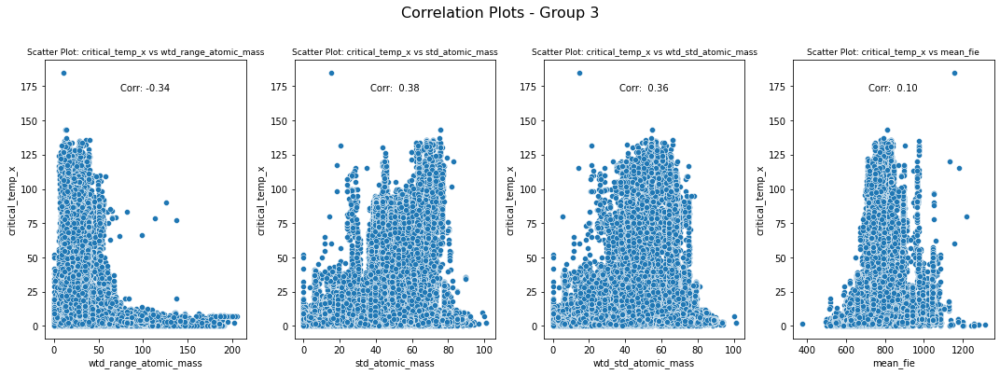

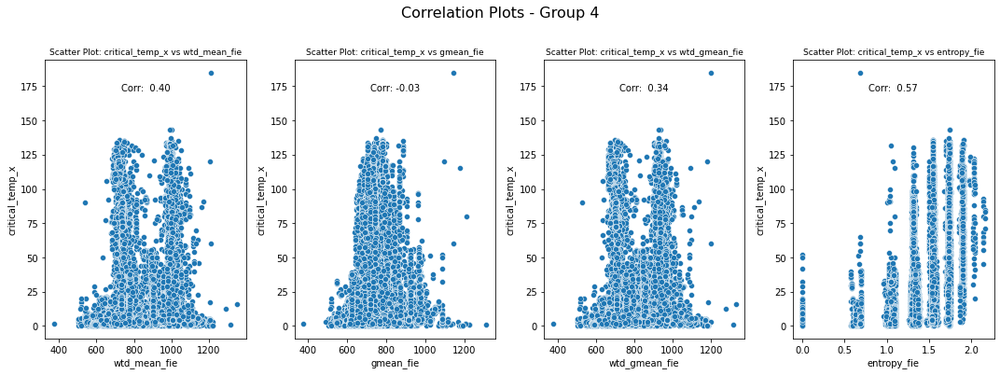

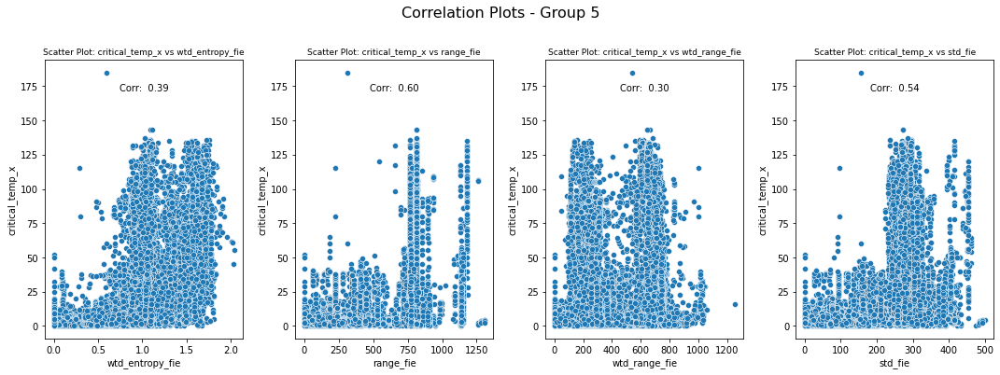

...

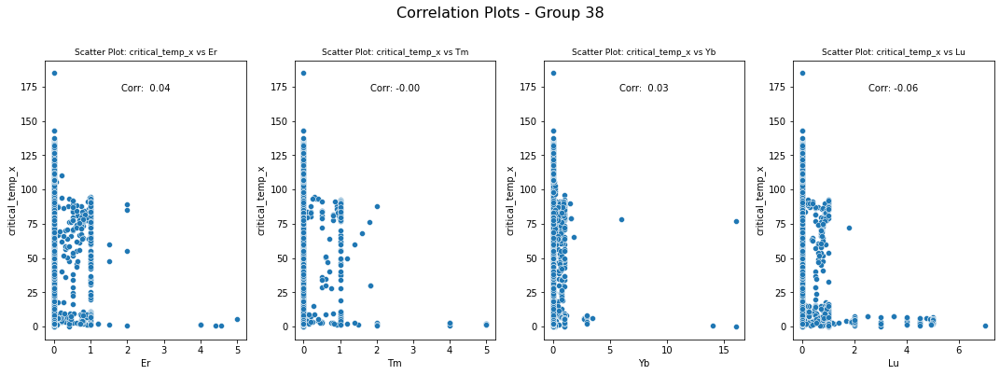

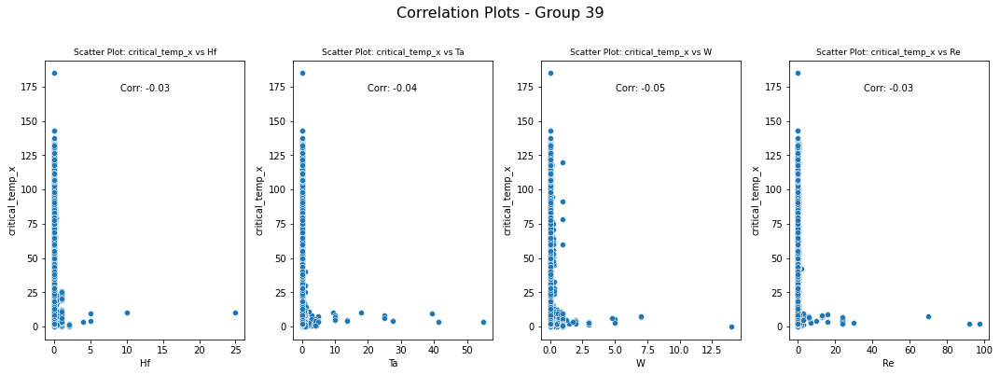

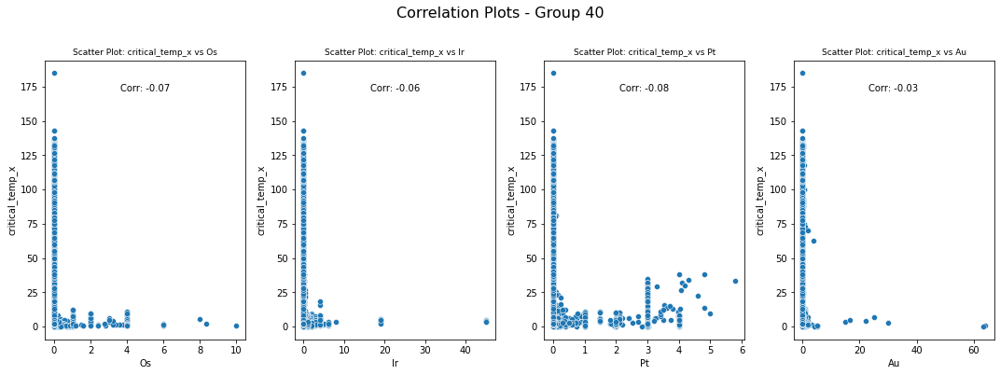

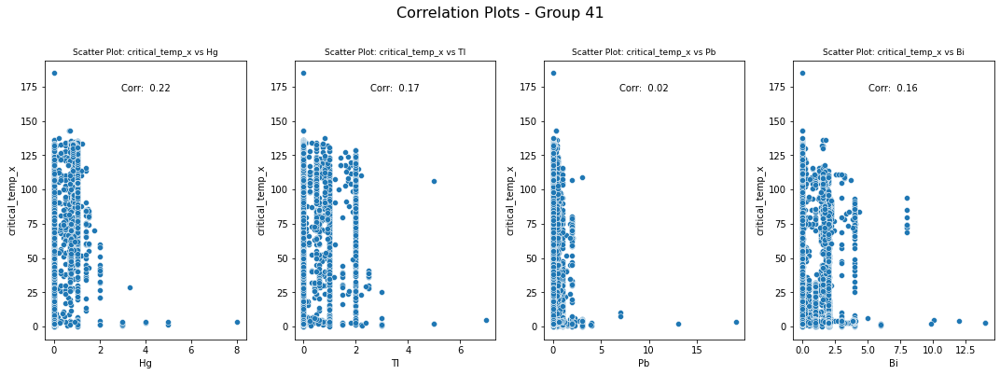

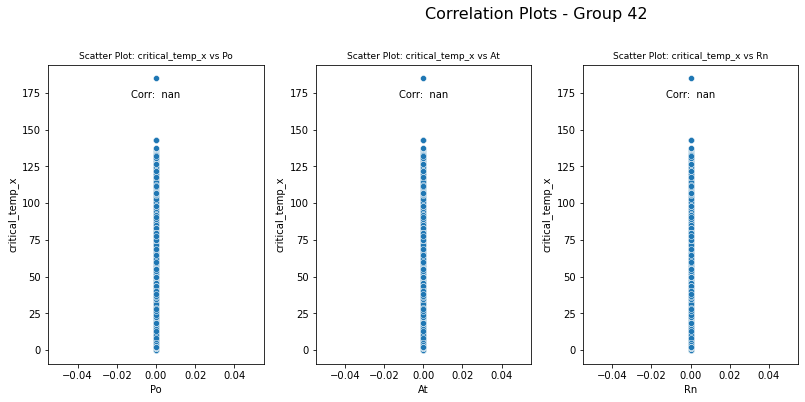

In [76]:
# calculate the correlations
correlations = merged_df_final.corr()

# list of all features except the target
all_features = merged_df_final.columns.tolist()
target_variable = 'critical_temp_x'
all_features.remove(target_variable)

#Define the number of features per group
features_per_group = 4
total_features = len(all_features)
total_groups = (total_features + features_per_group - 1) // features_per_group

# Iterate through groups
for group_num in range(total_groups):
    start_idx = group_num * features_per_group
    end_idx = min((group_num + 1) * features_per_group, total_features)
    selected_features = all_features[start_idx:end_idx]
    
    #Create a new figure for each group 
    plt.figure(figsize=(15,10))
    
    for idx, feature in enumerate(selected_features):
        plt.subplot(2, 4, idx + 1)
        sns.scatterplot(data=merged_df_final, x=feature, y=target_variable)    
        
        # Calcualte correlation coefficient
        corr_coeff = correlations.loc[feature, target_variable]
        
        #Annoate twith correlation coefficients
        plt.text(0.5, 0.9, f'Corr: {corr_coeff: .2f}', horizontalalignment='center',
                verticalalignment='center',transform=plt.gca().transAxes, fontsize=10)
        
        plt.title(f"Scatter Plot: {target_variable} vs {feature}", fontsize = 9) #adjust title size here
        
    plt.tight_layout()
    plt.subplots_adjust(top=0.9) #Adjust top spacing for the overall title
    plt.suptitle(f"Correlation Plots - Group {group_num+1}", fontsize = 16) # Overalltitle
    plt.show()        

The correlation plot grants insight into what features might have some type of relationship among our response variable critical temp. As we previously explored, there is a positive correlation between the number of elements and the critical temperature. We can note that there is a strong postive corrleation of 0.72 between critical temperature and the weighted standard deviation of Thermal Conductivity, indicating an increase in critical temperature we would have an increase in the weighted standard deviation of Thermal Conductivity. Of the elements featured in the study we see that Ba (Barium) & O (Oxygen) have a moderate correlation for critical temperature at 0.56 & 0.57 respectively. There is a moderate negative correlation of -0.62 between critical temperature and the weighted g-average of valence. 

### Examine the correlations among the features


In [78]:
correlations = merged_df_final.corr()

#set the correlation threshold
threshold = 0.90

#Create empty lists to store strong relationships 
strong_pos_corr = []
strong_neg_corr = []

# Iterate through the correlation matrix
for feature1 in correlations.columns:
    for feature2 in correlations.index:
        if feature1 !=feature2: # Avoid comparing a feature with itself
            corr_value = correlations.loc[feature2, feature1]
            if corr_value > threshold:
                strong_pos_corr.append((feature2, feature1, corr_value))
            elif corr_value < -threshold:
                strong_neg_corr.append((feature2, feature1, corr_value))

                
# Sort the correlations alphabetically
strong_pos_corr.sort()
strong_neg_corr.sort()
                
# Format results as table
pos_table = tabulate(strong_pos_corr, headers=["Feature 1", "Feature 2", "Correlation"], tablefmt="grid")
neg_table = tabulate(strong_neg_corr, headers=["Feature 1", "Feature 2", "Correlation"], tablefmt="grid")

#Display strong pos correlations
print("Strong Positive Correlations:")
print(pos_table)

print()

#Display strong pos correlations
print("Strong Negative Correlations:")
print(neg_table)
   

Strong Positive Correlations:
+-----------------------------+-----------------------------+---------------+
| Feature 1                   | Feature 2                   |   Correlation |
+=============================+=============================+===============+
| entropy_Density             | entropy_FusionHeat          |      0.917732 |
+-----------------------------+-----------------------------+---------------+
| entropy_Density             | entropy_Valence             |      0.900579 |
+-----------------------------+-----------------------------+---------------+
| entropy_Density             | entropy_atomic_mass         |      0.932668 |
+-----------------------------+-----------------------------+---------------+
| entropy_Density             | entropy_atomic_radius       |      0.91555  |
+-----------------------------+-----------------------------+---------------+
| entropy_Density             | entropy_fie                 |      0.902037 |
+-----------------------------+---

From the correlation table, we can see that the entropy of all of the features contained within the model are extremely positively correlated with all of the other entropy related features. Of the entropy's the strongest correlation is between the entropy of Valence and the entropy of FIE at 0.993 The only two very strong negative correlation that we observe within the study are between the weighted geometric mean of atomic radius and the weighted average of FIE. It makes logicial sense that the features of a particular subgroup are interrelated with a strong correlation to one another. 

# Modeling

In [ ]:
##Multi-Nomial Regression with Distance Group/ EXCEPTIONAL WORK

df3= flight_data_df

df4 = df3.select_dtypes(include = ['float','integer'])

#Removing NaN Values
for column in df4.columns:
    if df4[column].isnull().any():
        count = df4[column].isnull().sum()
        print(column + " has " +str(count)+" NaN values")
       
df3_reduced = df4.dropna()

# Dropping columns with less than 2 classes

df3_new = df3_reduced.loc[:, df3_reduced.apply(pd.Series.nunique) > 1]


#df3_new = df3_new.select_dtypes(include = )
#print(X2.dtypes)
X = df3_new.drop('DistanceGroup', axis = 1)
y = df3_new.DistanceGroup


X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.5, random_state = 50)
X_train.shape, X_test.shape, y_train.shape, y_test.shape


#Scaling the data
#Credit to: https://scikit-learn.org/stable/modules/preprocessing.html
#scaler = preprocessing.StandardScaler().fit(X_train)

#X_scaled = scaler.transform(X)

X, y = make_classification(random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

#Credit to https://machinelearningmastery.com/multinomial-logistic-regression-with-python/
pipe = make_pipeline(StandardScaler(), LogisticRegression(multi_class = 'multinomial',solver = 'lbfgs'))
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
n_scores = cross_val_score(model, X_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1)
pipe.fit(X_train, y_train)  # apply scaling on training data
Pipeline(steps=[('standardscaler', StandardScaler(with_mean=False)),
                ('logisticregression', LogisticRegression())])


final = pipe.score(X_test, y_test)
print('Accuracy with No L2 Penalty')
print('Accuracy with Standardization and Cross Validation: %.3f' % (mean(n_scores)))
print('Accuarcy with Standardization and not Cross Validation: %.3f' % (final))
#Creating Confusion Matrix
#Credit to https://realpython.com/logistic-regression-python/
confusion_matrix(y,pipe.predict(X))
cm = confusion_matrix(y, pipe.predict(X))

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted Distance Group 0', 'Predicted Distance Group 1'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual Distance Group 0', 'Actual Distance Group 1'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()


#Creating Output from Models
print(classification_report(y, pipe.predict(X)))

#With L2 Penalty
pipe = make_pipeline(StandardScaler(), LogisticRegression(multi_class = 'multinomial',solver = 'lbfgs', penalty = 'l2',C=.05))
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
model = LogisticRegression(multi_class='multinomial', solver='lbfgs', penalty = 'l2',C=.05)
n_scores = cross_val_score(model, X_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1)
pipe.fit(X_train, y_train)  # apply scaling on training data
Pipeline(steps=[('standardscaler', StandardScaler(with_mean=False)),
                ('logisticregression', LogisticRegression())])


final = pipe.score(X_test, y_test)
print('Accuracy with L2 Penalty')
print('Accuracy with Standardization and Cross Validation: %.3f' % (mean(n_scores)))
print('Accuarcy with Standardization and not Cross Validation: %.3f' % (final))

#Creating Confusion Matrix
#Credit to https://realpython.com/logistic-regression-python/
confusion_matrix(y,pipe.predict(X))
cm = confusion_matrix(y, pipe.predict(X))

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted Distance Group 0', 'Predicted Distance Group 1'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual Distance Group 0', 'Actual Distance Group 1'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()


#Creating Output from Models
print(classification_report(y, pipe.predict(X)))

From the output above we can see the logistic regression for classifying Distance group is highly accurate. Looking at the Confusion Matrix below, we see there is a difference not only with the implementation of K-Fold Cross Validation, but also with the addition of the L2 Penalty. We are more confident in the models without the L2 penalty as these classify more accurately as well as provide enough room to provide post model adjustments if need be. This is our first attempt at modeling with our Flight dataset and in the future will bring about more robust methods to our modeling. Upon further review of the model, there are many more directions available for us to entertain, but would require a more in depth understanding of modeling within Pandas.

## Explore Attributes and Class
Identify and explain interesting relationships between features and the class you are trying to predict (i.e., relationships with variables and the target classification).